## Myobock Sensor Data Preprocessing and Plotting

This Python script processes Myobock EMG data collected from multiple participants to extract muscle activity patterns for analysis. The processing pipeline includes filtering, rectification, smoothing, envelope extraction, normalization, and visualization. Key steps:

- **Global Setup**: Defines participants, base data paths, and file structure. Sets parameters for filtering, sampling rate (360 Hz), and muscle names.

- **Data Loading**: Identifies Myo `.csv` files within the participant folders and sorts files by timestamps extracted from filenames.

- **Preprocessing Steps**:
  1. **NaN Handling**: Replaces any missing data points with zeros.
  2. **High-Pass Filtering**: Removes low-frequency noise using a cutoff of 10 Hz.
  3. **Rectification**: Converts signals to absolute values.
  4. **Smoothing**: Applies RMS smoothing with a Hanning window.
  5. **Envelope Extraction**: Uses low-pass filtering (cutoff: 5 Hz) for signal envelopes.
  6. **Triceps Adjustment**: Lowers the Triceps envelope if it exceeds a baseline value.

- **Normalization**: Computes a global maximum across all envelopes within each group of trials and normalizes signals for consistency.

- **Visualization**: Generates step-by-step plots for raw, filtered, rectified, smoothed, and normalized signals. Produces group-level summary plots for inspection and analysis.

- **Main Workflow**: Iterates over participants and trial groups, processes EMG data, and saves results (e.g., normalized envelopes, intermediate steps) in structured directories.


[INFO] P(1), group [0, 1, 12, 13]: global max = 18.565735581712364


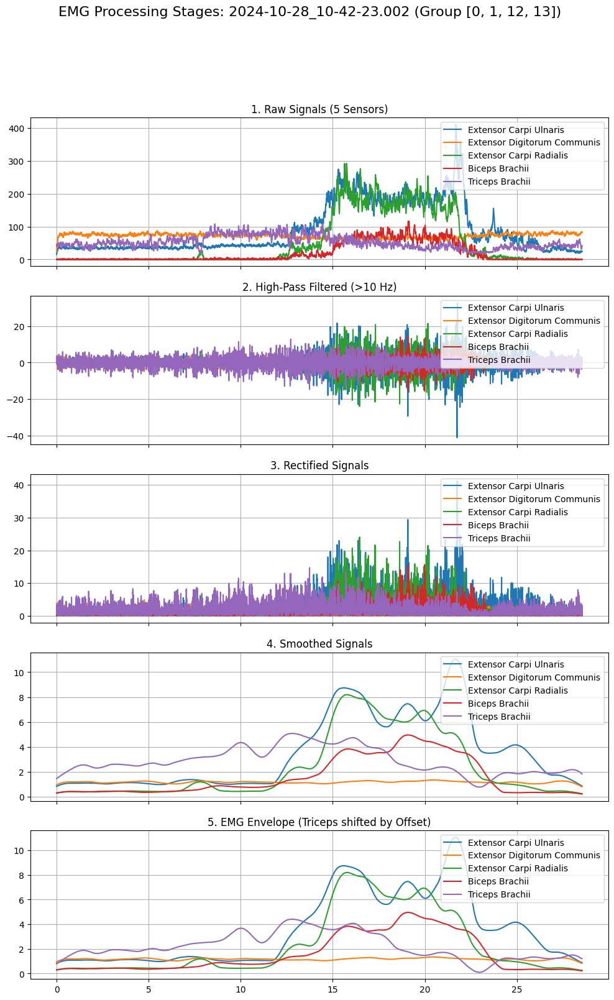

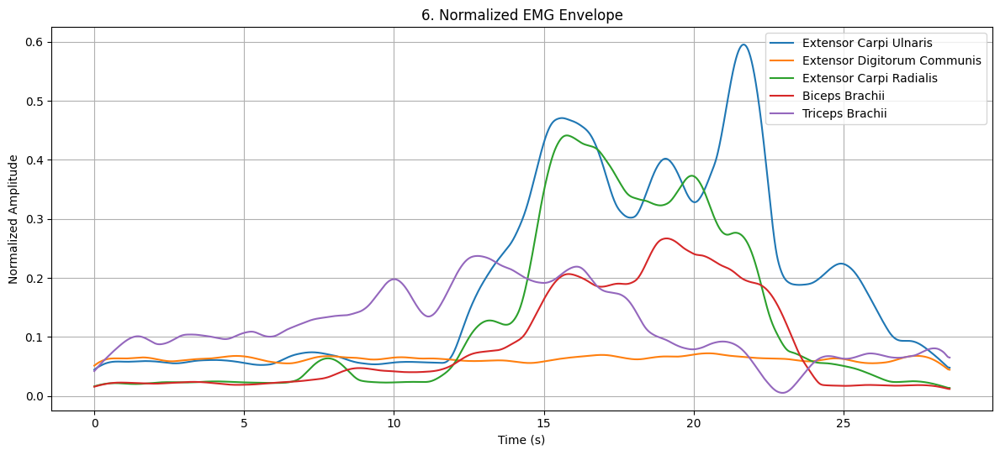

[INFO] Done processing processed_myo_2024-10-28_10-42-23.002


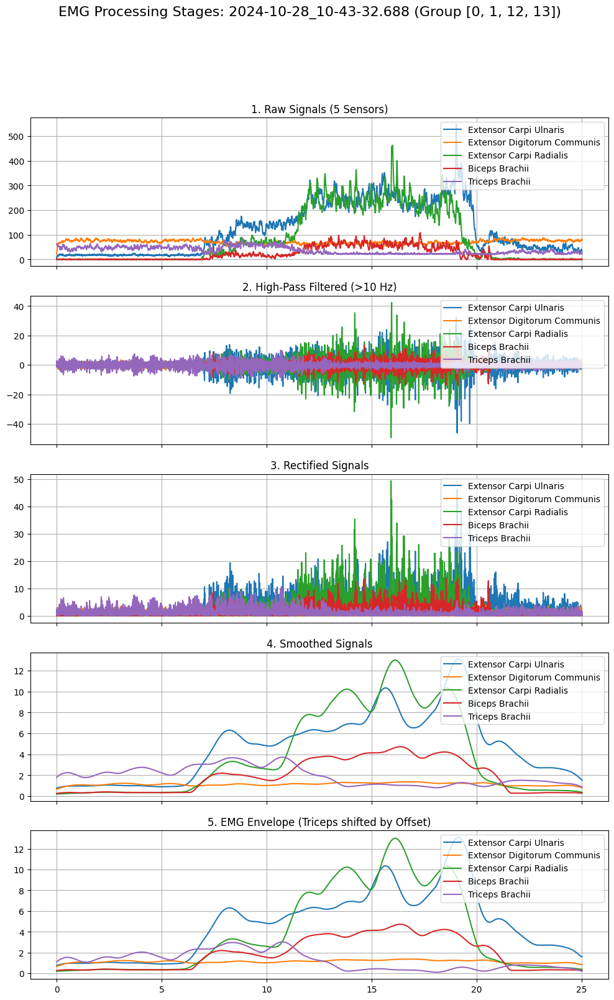

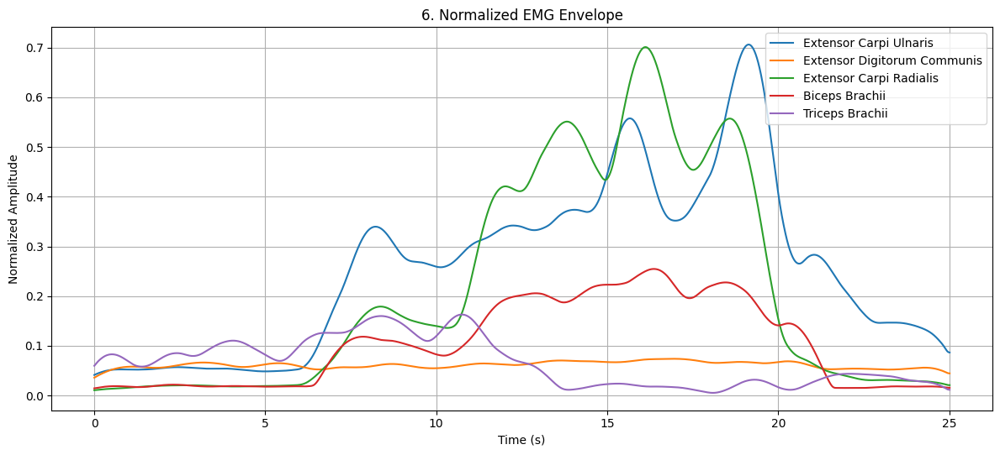

[INFO] Done processing processed_myo_2024-10-28_10-43-32.688


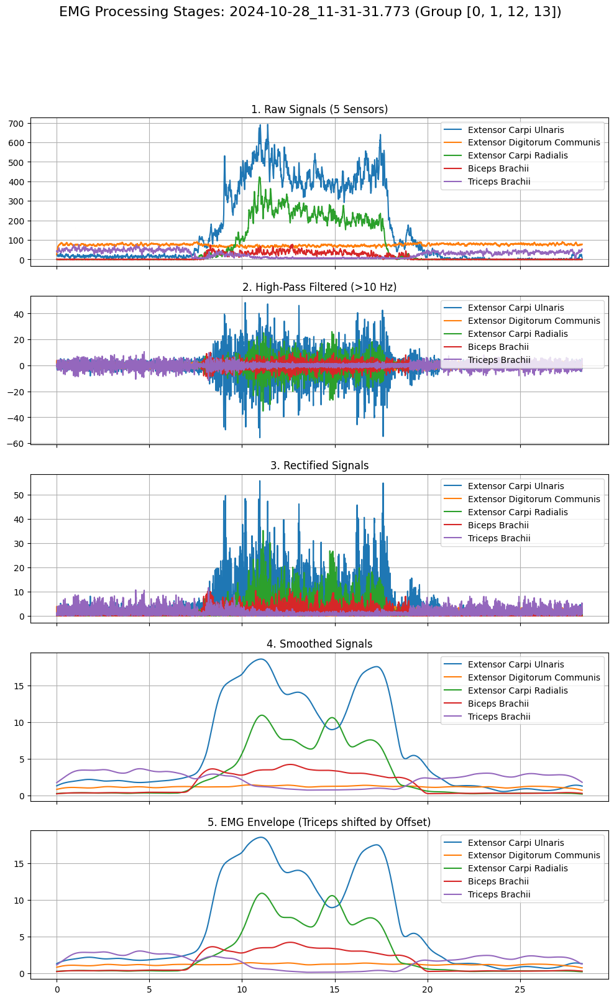

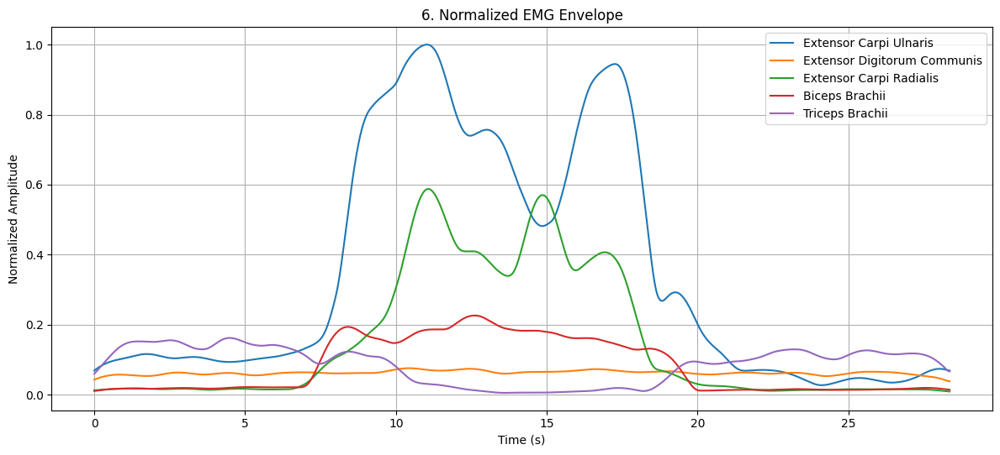

[INFO] Done processing processed_myo_2024-10-28_11-31-31.773


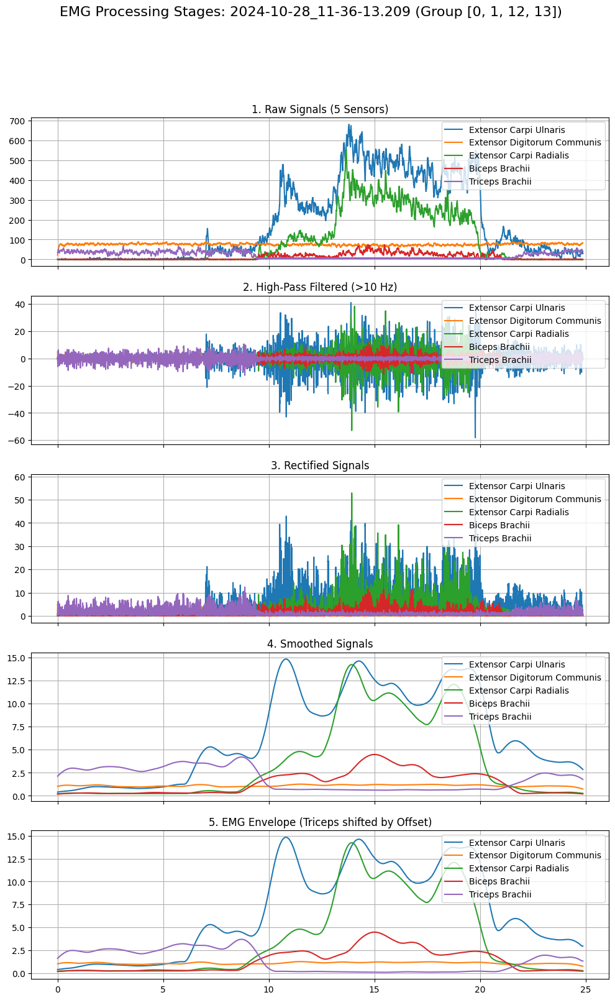

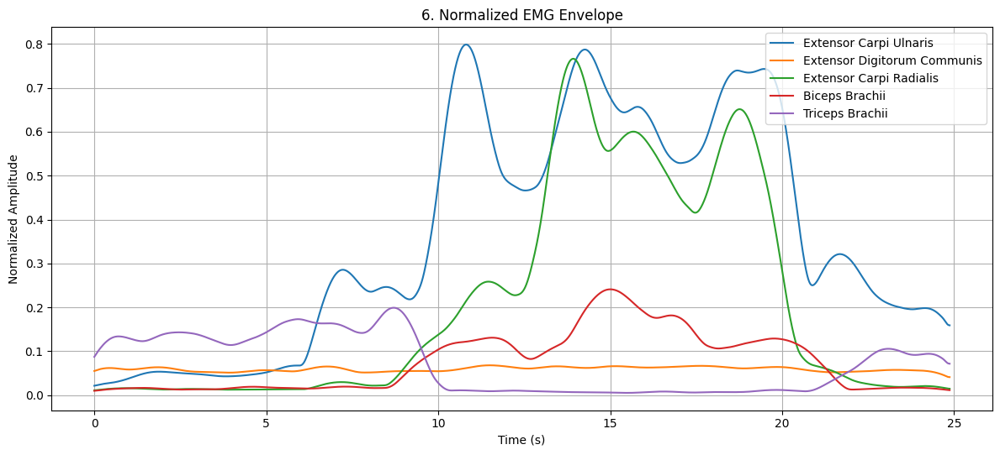

[INFO] Done processing processed_myo_2024-10-28_11-36-13.209
[INFO] P(1), group [2, 3, 14, 15]: global max = 12.602973517346047


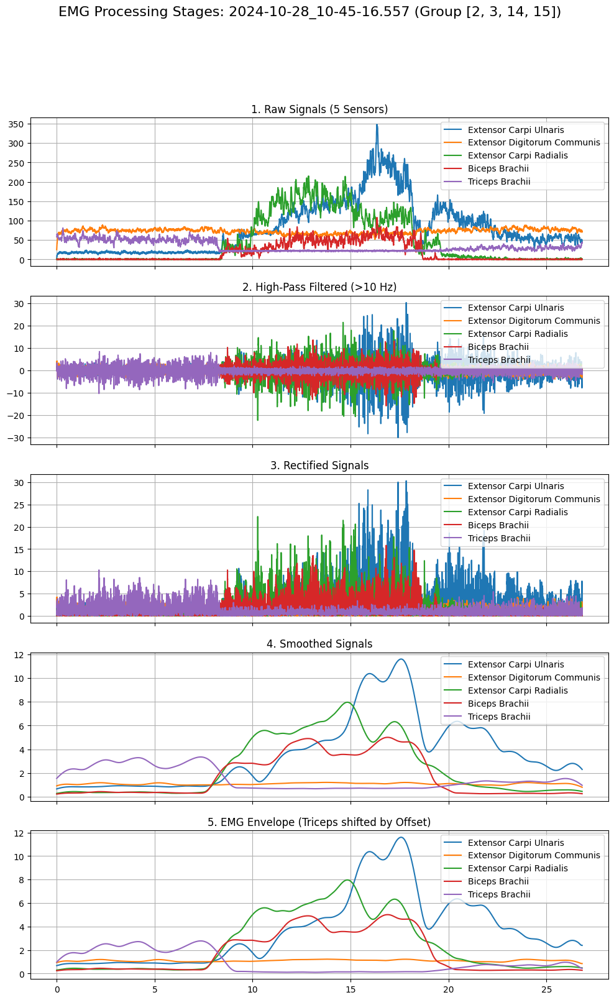

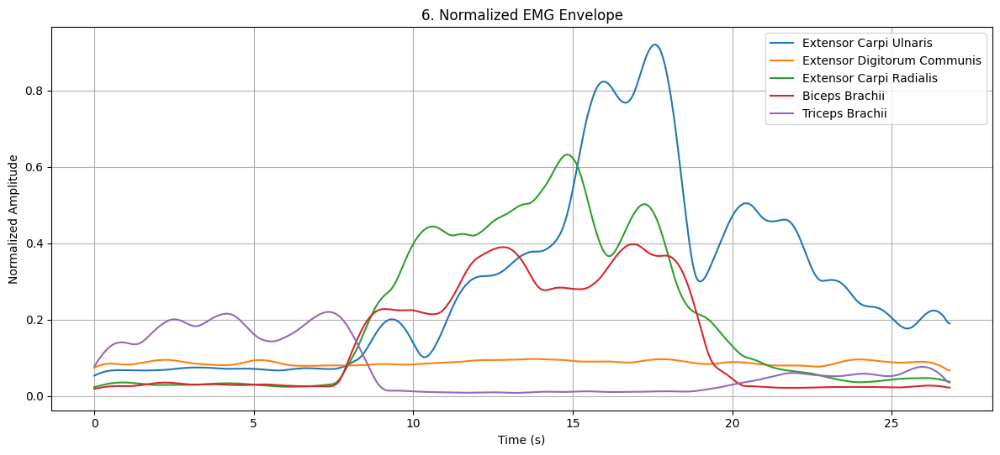

[INFO] Done processing processed_myo_2024-10-28_10-45-16.557


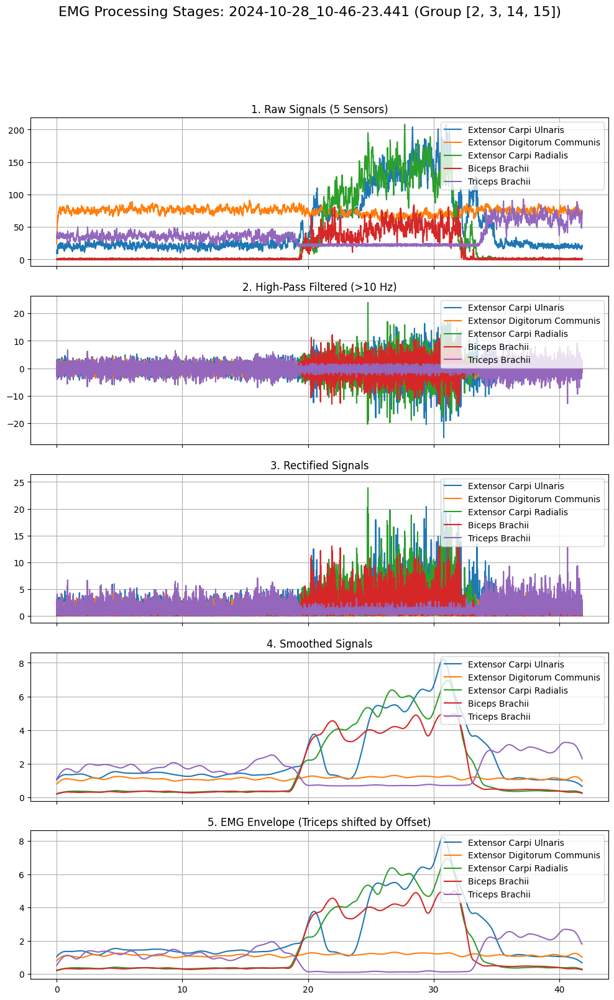

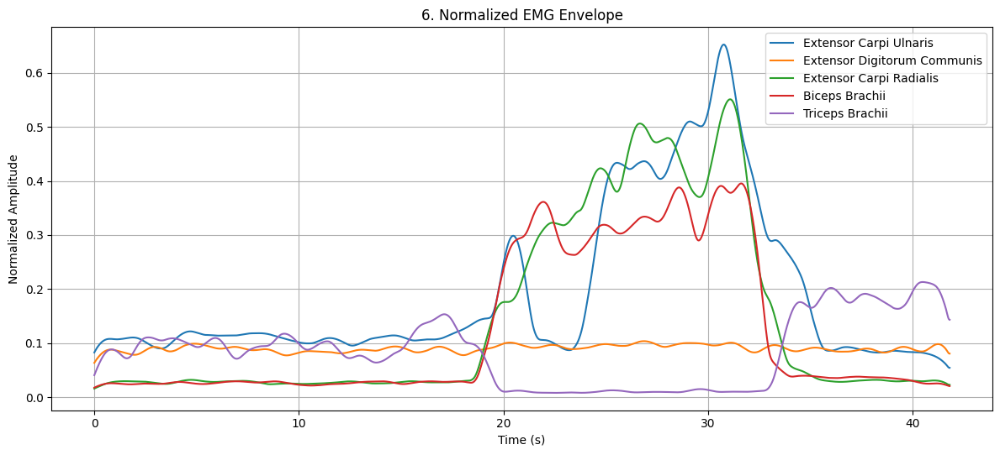

[INFO] Done processing processed_myo_2024-10-28_10-46-23.441


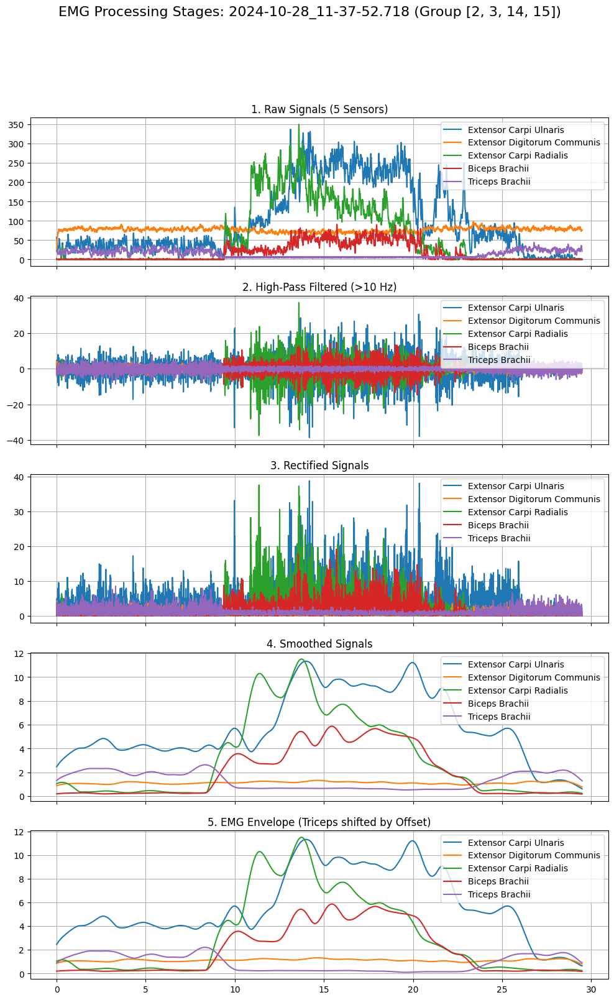

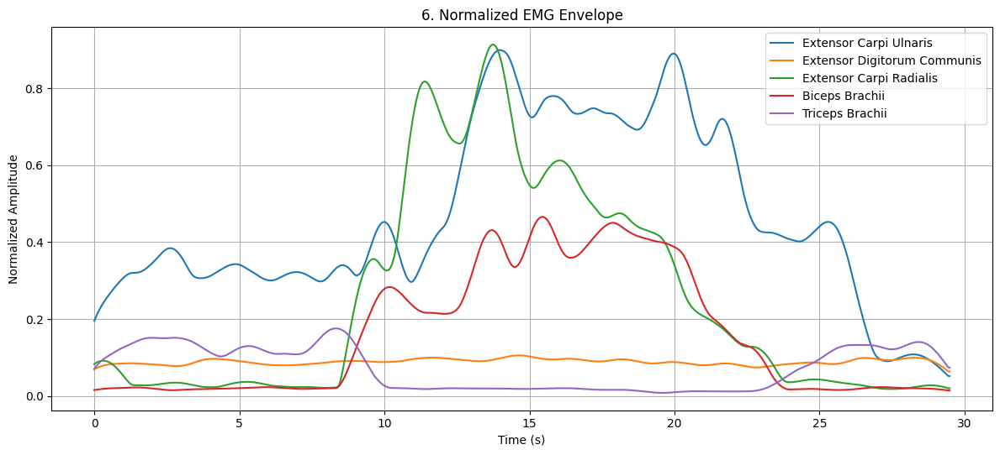

[INFO] Done processing processed_myo_2024-10-28_11-37-52.718


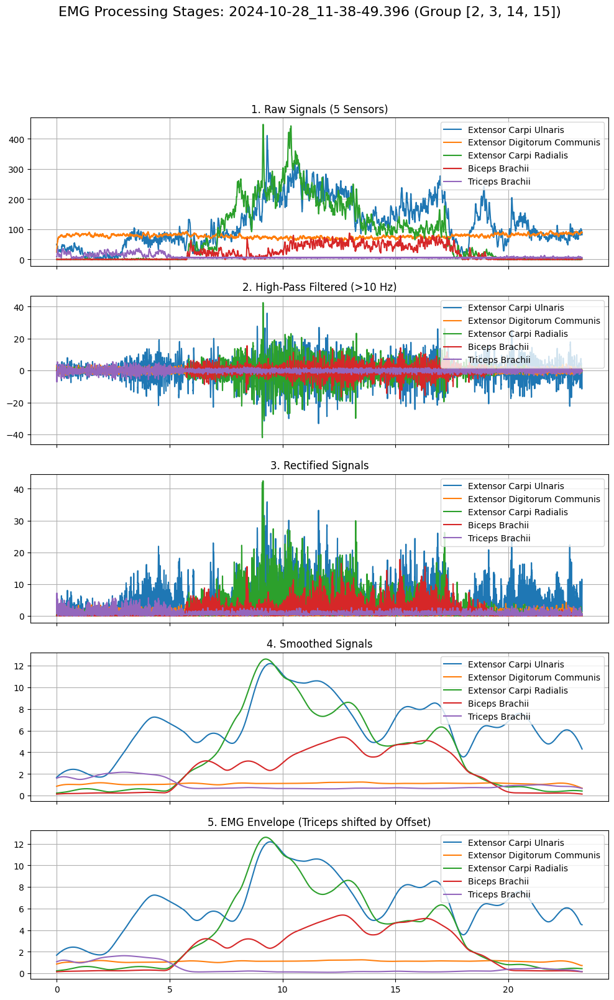

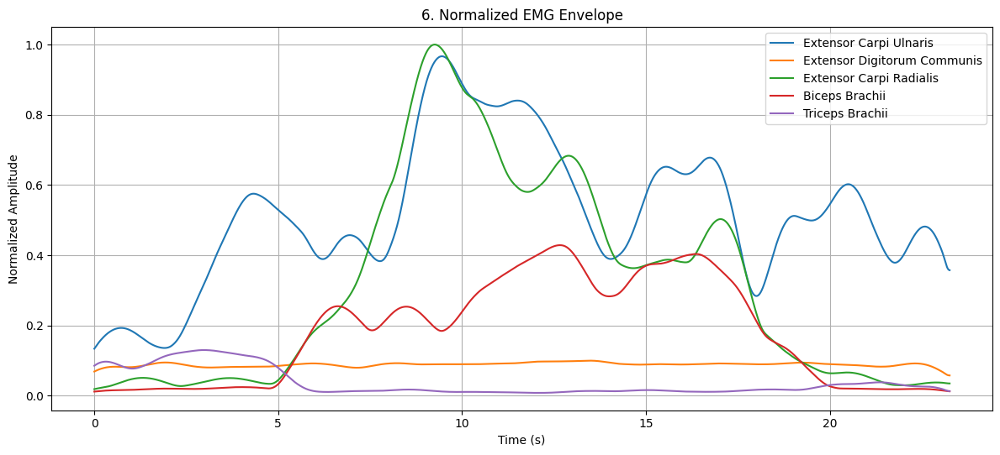

[INFO] Done processing processed_myo_2024-10-28_11-38-49.396
[INFO] P(1), group [4, 5, 16, 17]: global max = 38.500731441614576


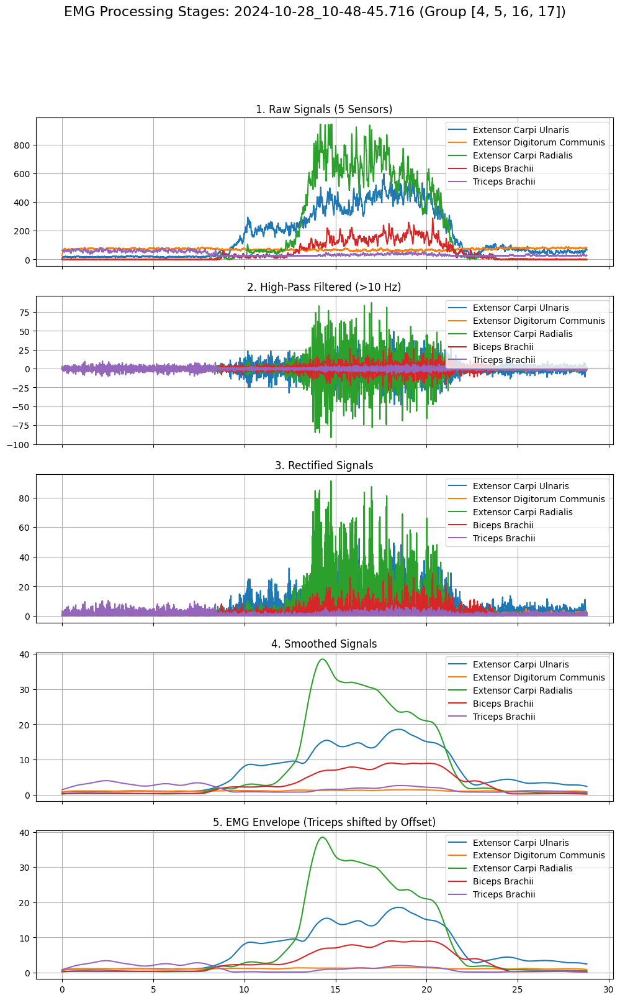

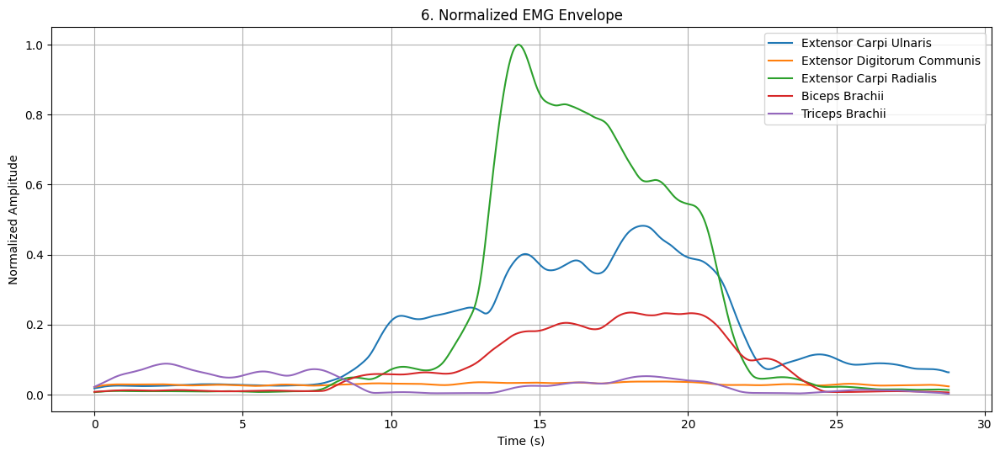

[INFO] Done processing processed_myo_2024-10-28_10-48-45.716


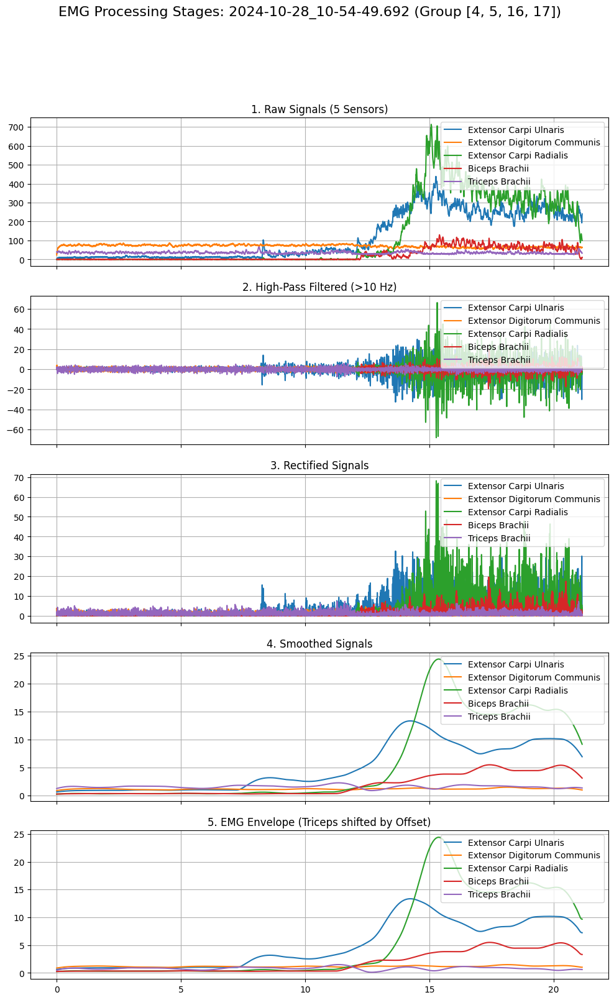

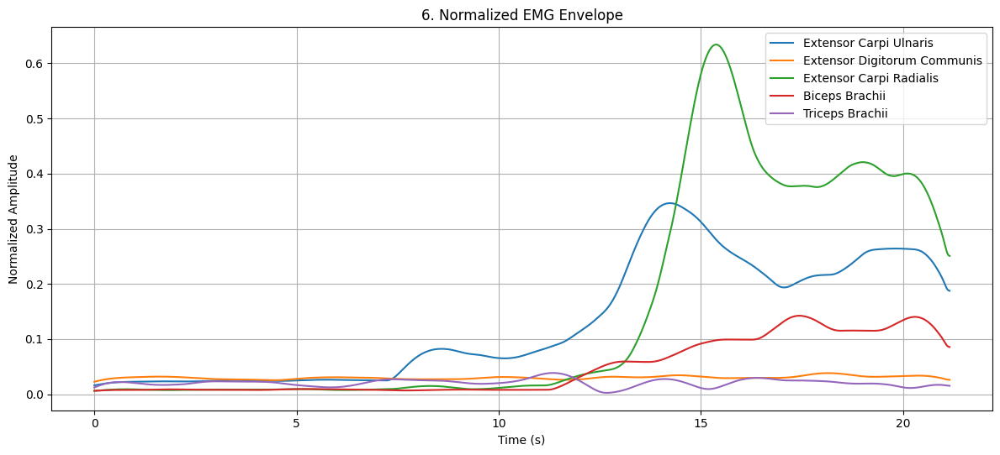

[INFO] Done processing processed_myo_2024-10-28_10-54-49.692


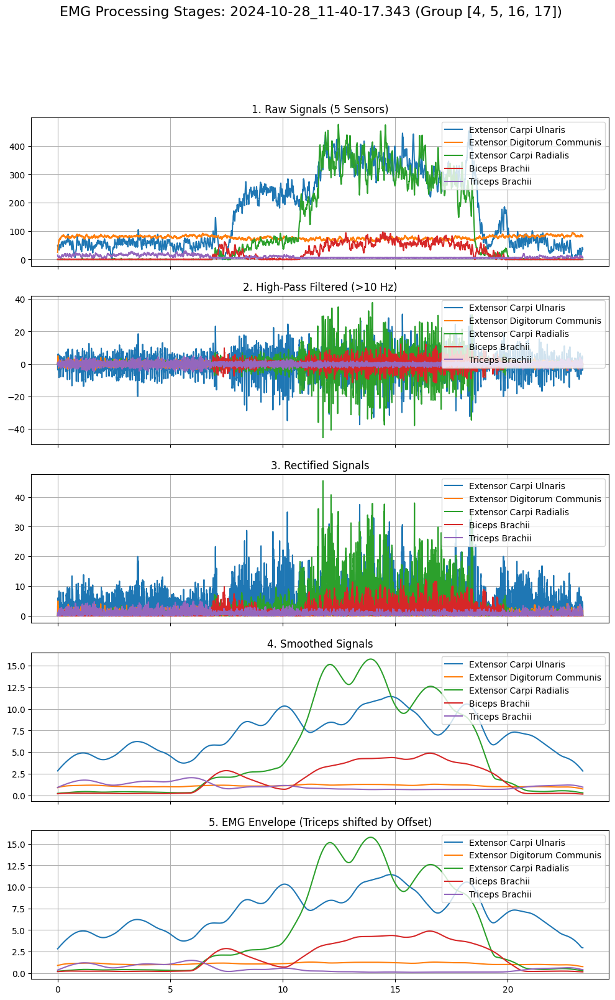

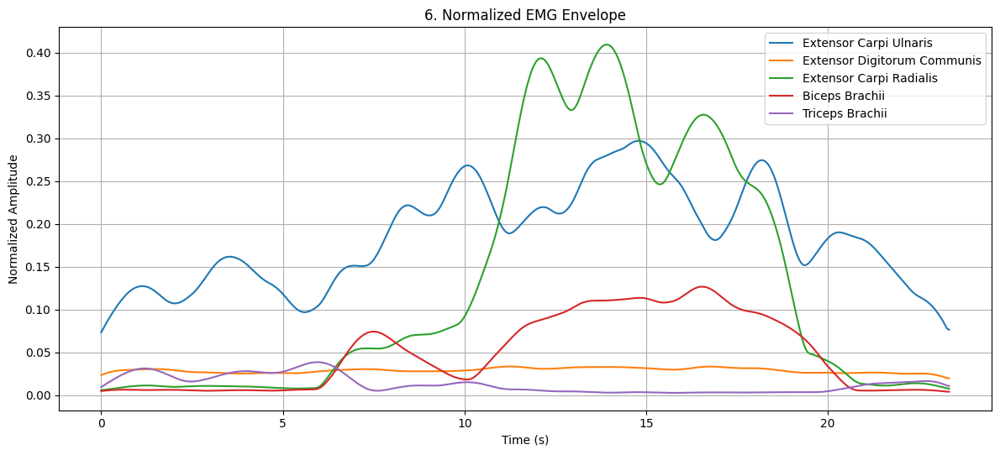

[INFO] Done processing processed_myo_2024-10-28_11-40-17.343


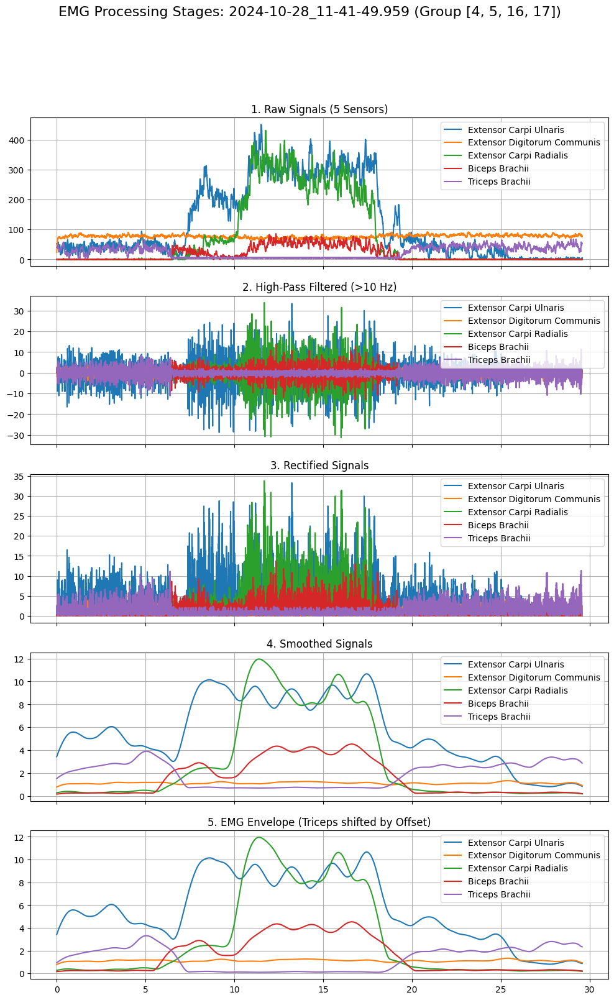

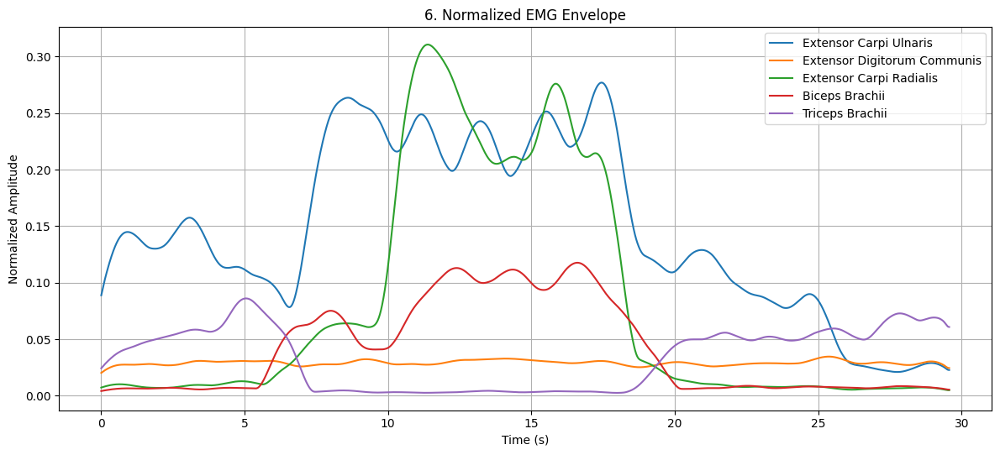

[INFO] Done processing processed_myo_2024-10-28_11-41-49.959
[INFO] P(1), group [6, 7, 18, 19]: global max = 16.436862122861594


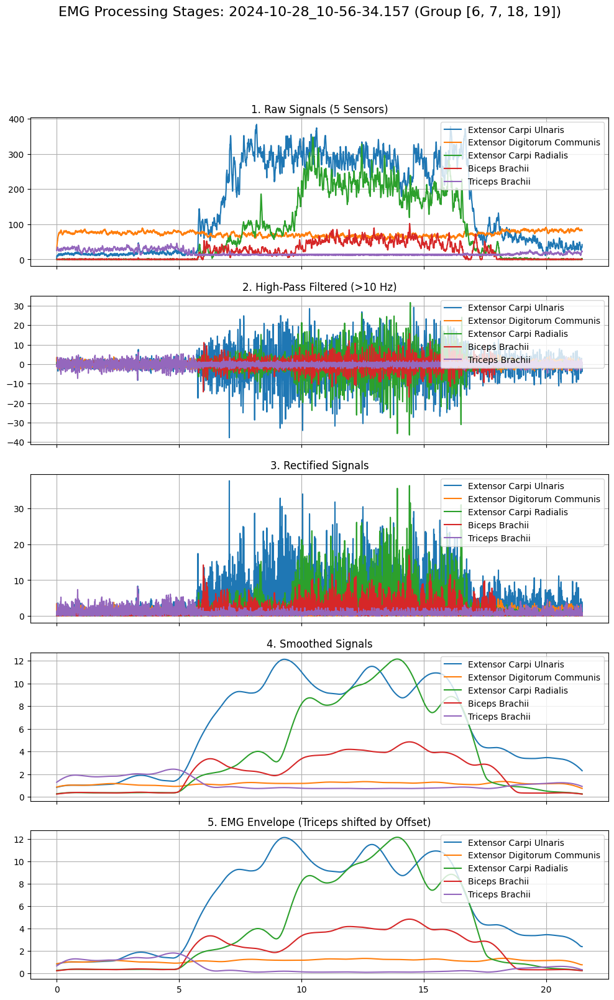

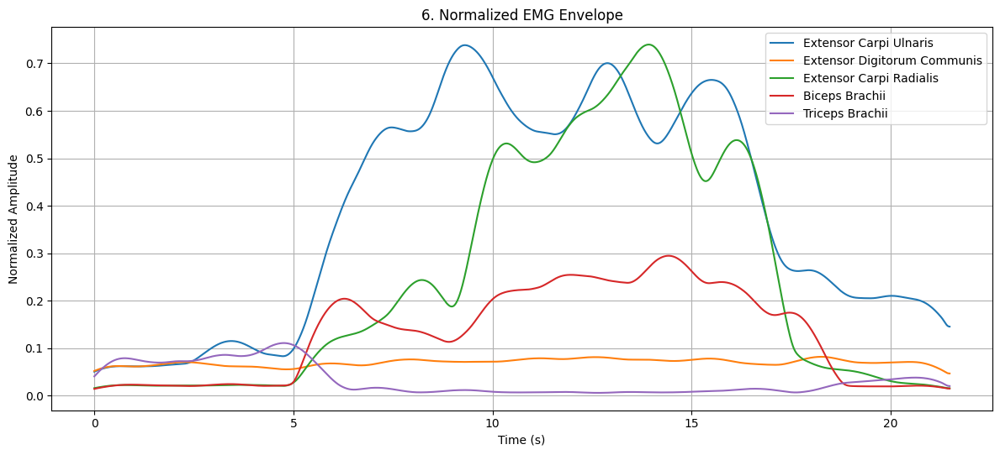

[INFO] Done processing processed_myo_2024-10-28_10-56-34.157


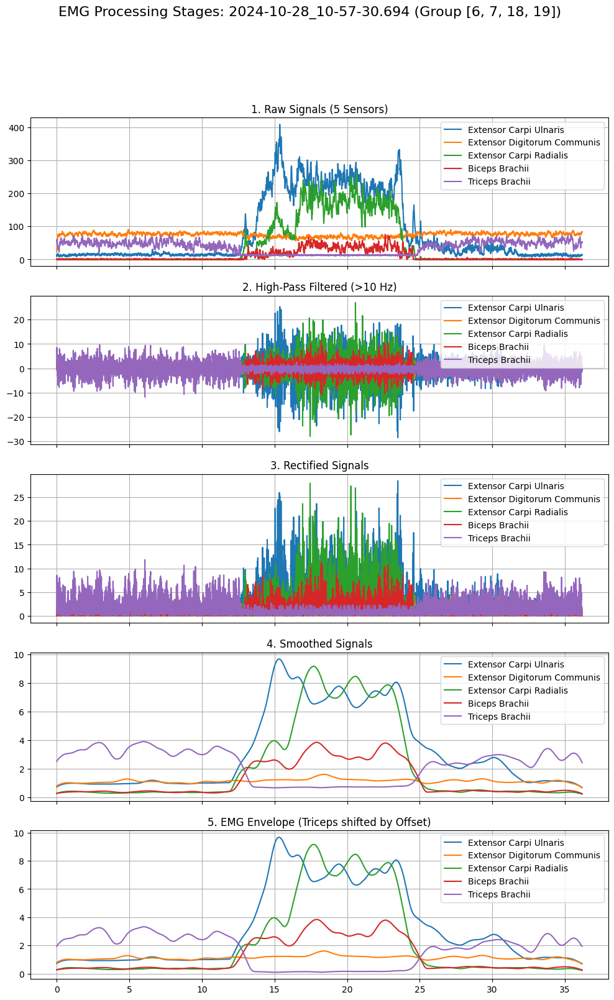

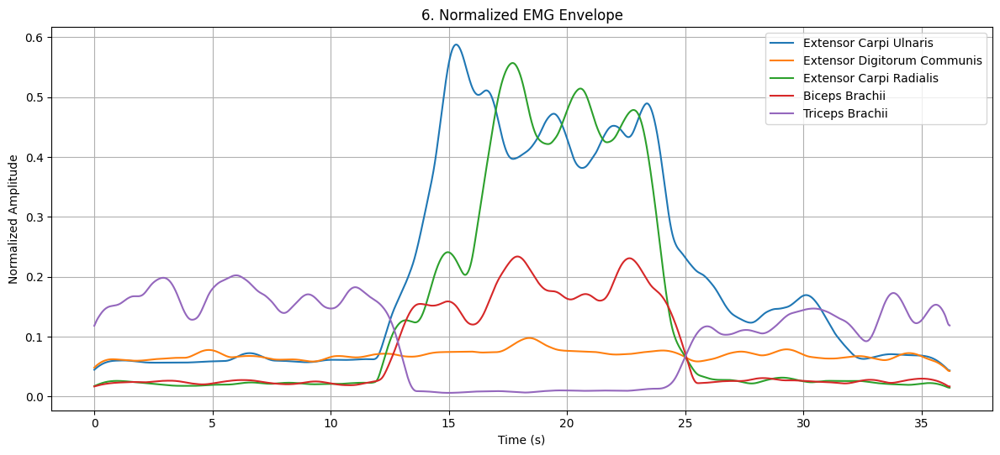

[INFO] Done processing processed_myo_2024-10-28_10-57-30.694


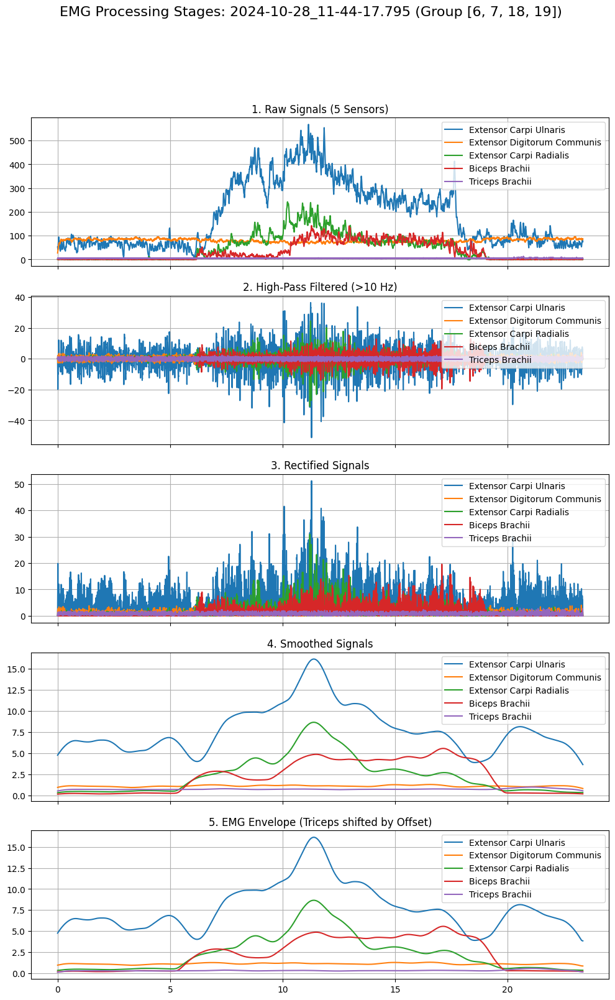

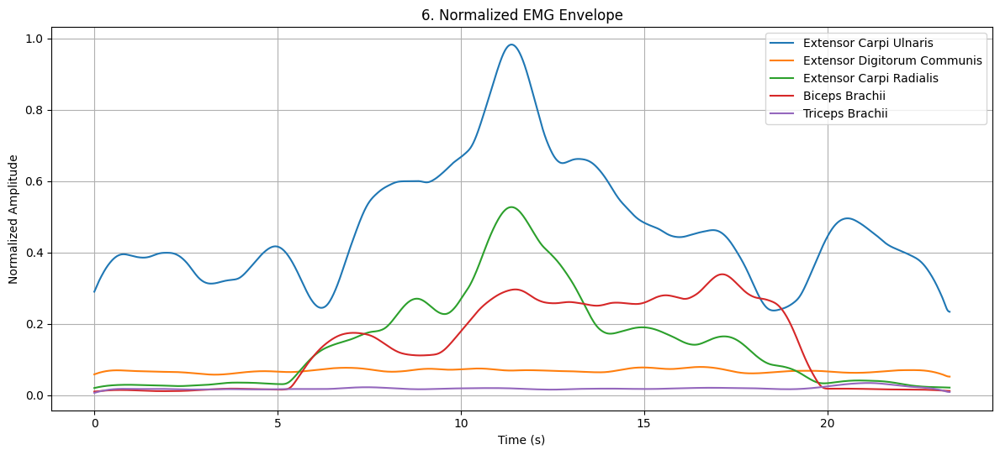

[INFO] Done processing processed_myo_2024-10-28_11-44-17.795


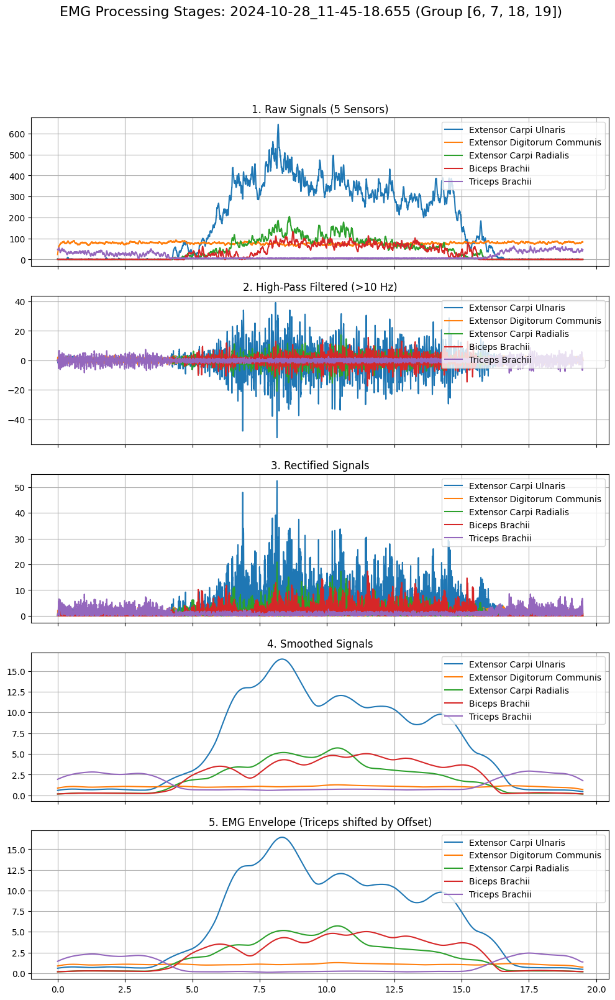

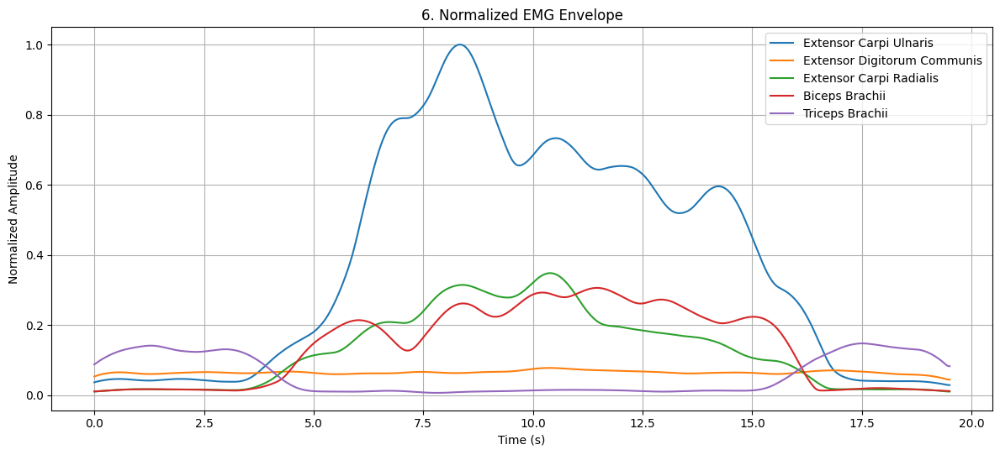

[INFO] Done processing processed_myo_2024-10-28_11-45-18.655
[INFO] P(1), group [8, 9, 20, 21]: global max = 15.547432835617007


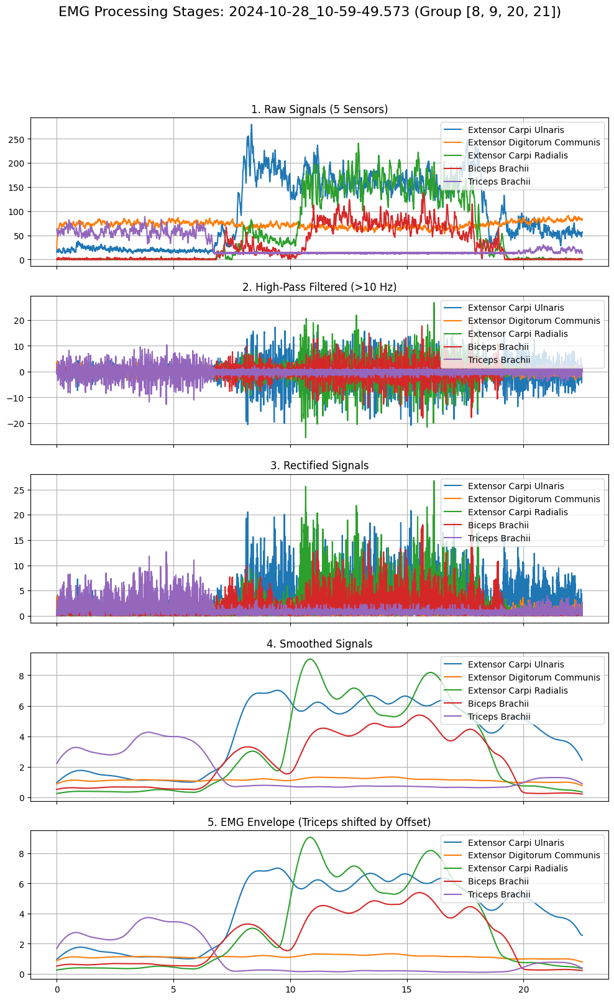

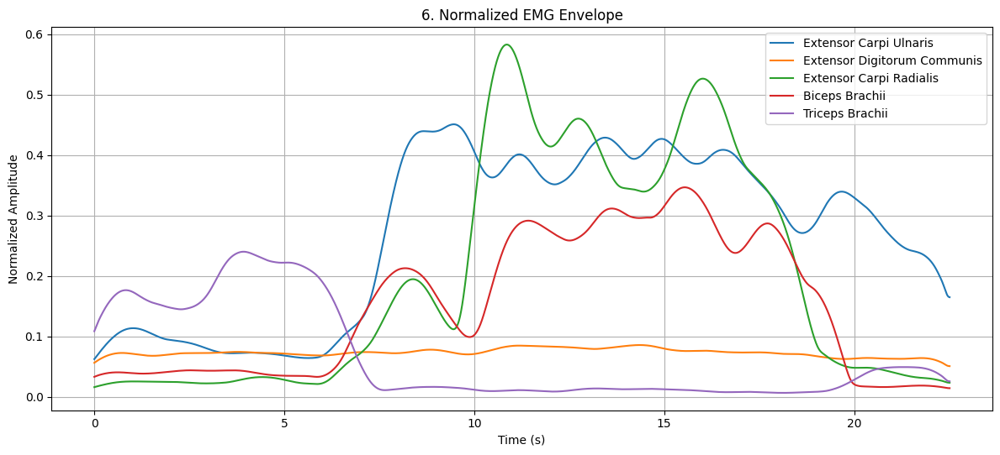

[INFO] Done processing processed_myo_2024-10-28_10-59-49.573


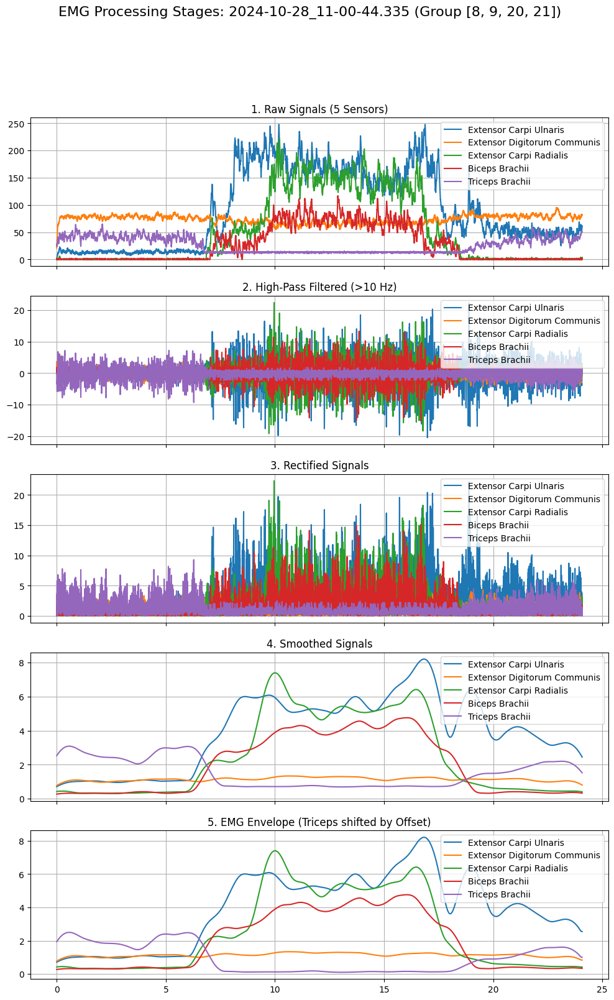

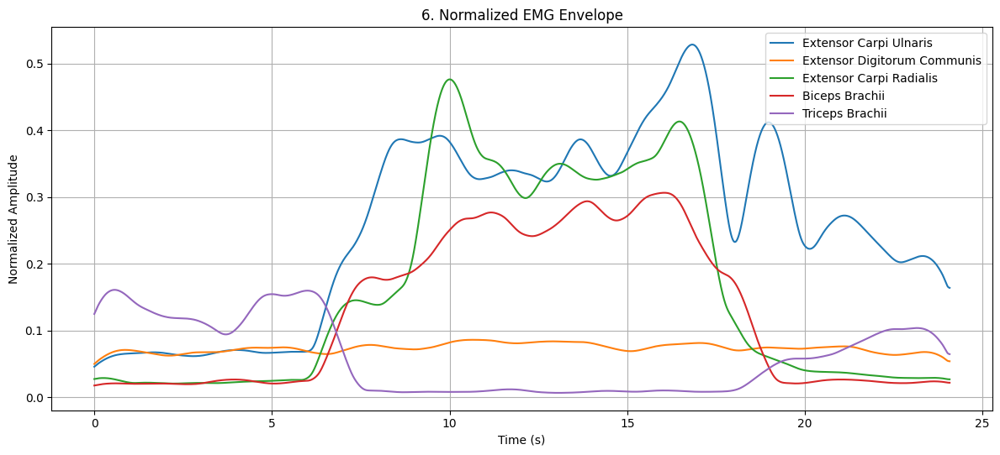

[INFO] Done processing processed_myo_2024-10-28_11-00-44.335


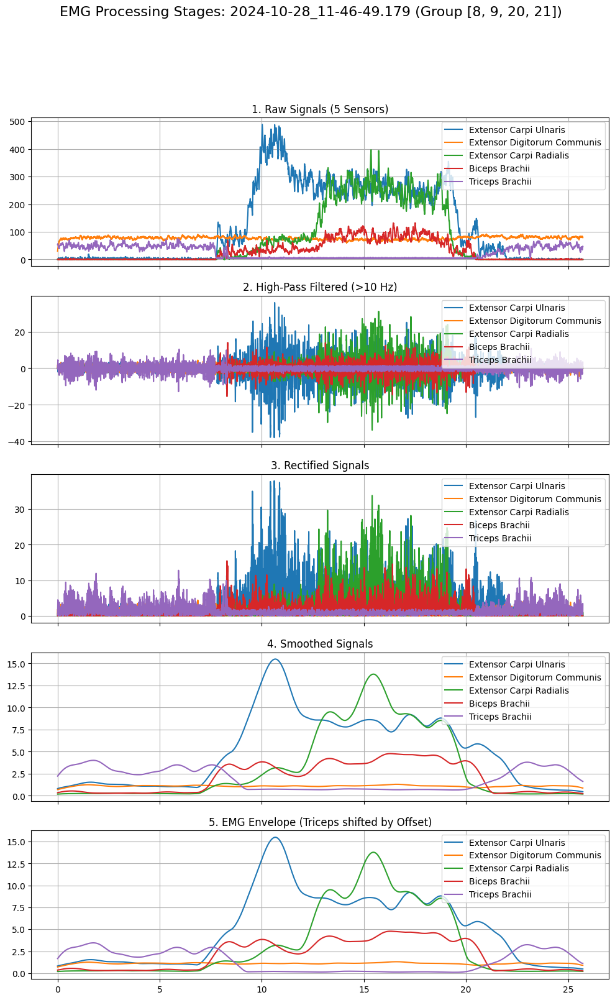

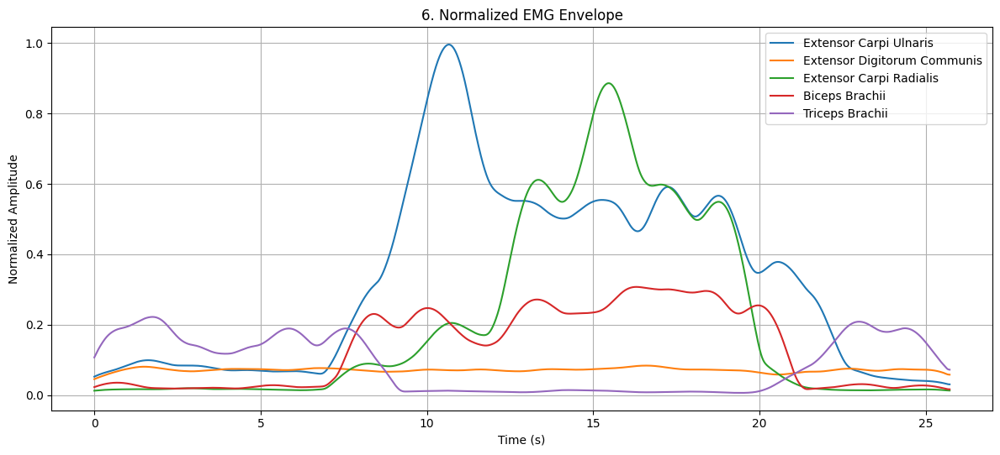

[INFO] Done processing processed_myo_2024-10-28_11-46-49.179


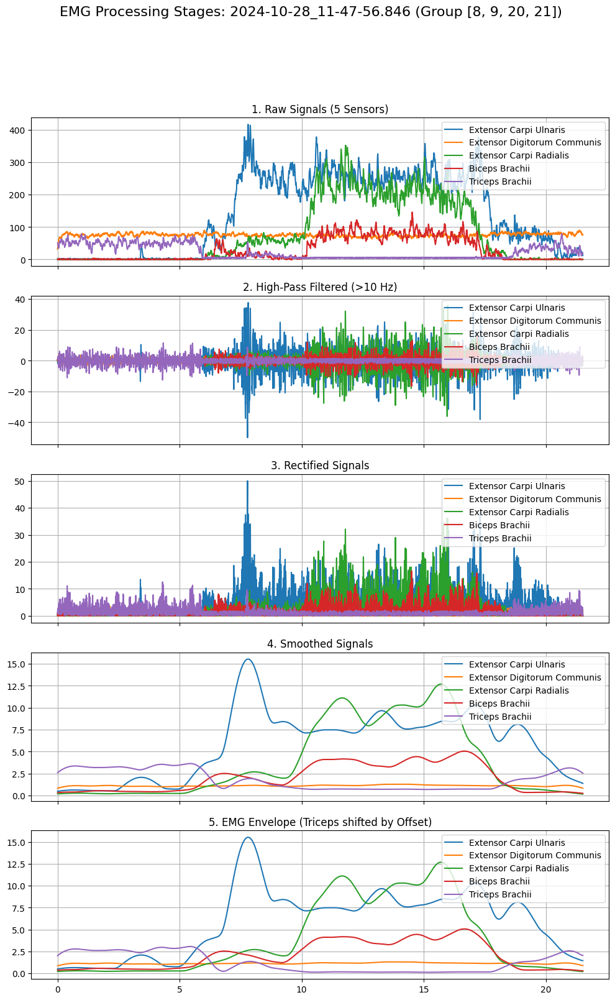

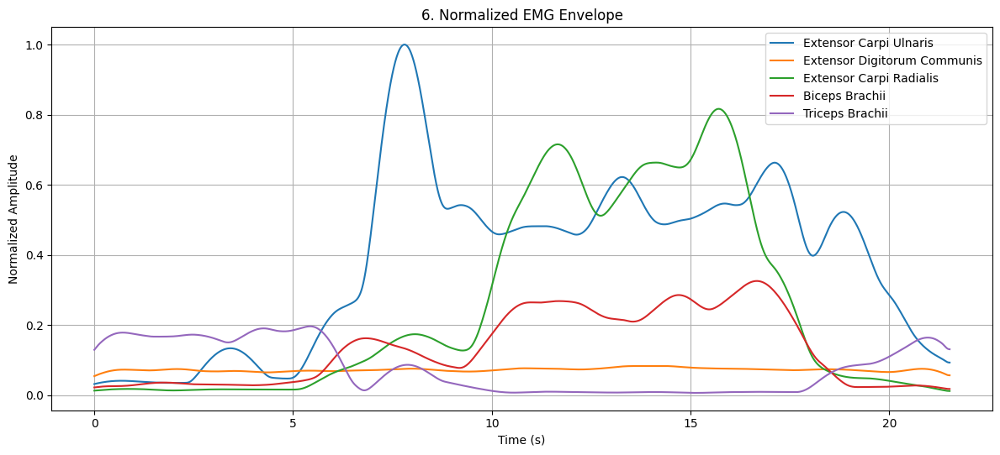

[INFO] Done processing processed_myo_2024-10-28_11-47-56.846
[INFO] P(1), group [10, 11, 22, 23]: global max = 17.90829757345184


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt, iirnotch
import pandas as pd
from datetime import datetime

# Define paths, participants and Parameters
base_path = r"C:\Users\schmi\Documents\Studium\TUM\5. Semester\Masterthesis\Experimental Data"
participants = range(1, 9) 
fs = 375               # Sampling frequency
highpass_cutoff = 10.0 # High-pass cutoff frequency
envelope_lowcut = 5.0  # Low-pass cutoff for envelope
desired_baseline = 0.1 # Triceps minimum target  

MUSCLES = [
    "Extensor Carpi Ulnaris",
    "Extensor Digitorum Communis",
    "Extensor Carpi Radialis",
    "Biceps Brachii",
    "Triceps Brachii",
]

# Grouping logic according to Experimental Protocol (indices 0-23 after sorting)
desired_order_groups = [
    [0, 1, 12, 13],
    [2, 3, 14, 15],
    [4, 5, 16, 17],
    [6, 7, 18, 19],
    [8, 9, 20, 21],
    [10, 11, 22, 23]
]

def extract_timestamp(filename):
    """
    Extracts a datetime object from a filename of the format:
    sensor_data_YYYY-MM-DD_HH-MM-SS.xxx.csv
    Example: sensor_data_2024-10-28_10-46-23.441.csv
    """
    base = os.path.basename(filename)
    # Remove prefix 'sensor_data_' if present
    if base.startswith("sensor_data_"):
        base = base[len("sensor_data_"):]
    # Remove '.csv' extension
    if base.endswith(".csv"):
        base = base[:-4]
    date_str, time_str = base.rsplit('_', 1)

    # Split the time into seconds and fractional part
    secs_str, ms_str = time_str.split('.')
    # Replace '-' in time with ':'
    secs_str = secs_str.replace('-', ':')
    # Combine into a datetime string
    dt_str = f"{date_str} {secs_str}.{ms_str}"
    dt = datetime.strptime(dt_str, '%Y-%m-%d %H:%M:%S.%f')
    return dt

def preprocess_nan(signals):
    """Replace NaN with 0."""
    return np.nan_to_num(signals)

def highpass_filter(data, cutoff, fs, order=4):
    """Apply a high-pass Butterworth filter."""
    nyq = 0.5 * fs
    high = cutoff / nyq
    b, a = butter(order, high, btype='high')
    filtered = filtfilt(b, a, data, axis=0)
    return filtered

# When taking a look at the FFT Plots no increased powerline noise at frquenciy 50 Hz and its harmonics are visible - no notch filter needed 
#def notch_filter(data, f0, fs, Q=5.0):
    """Apply a notch filter (IIR) to remove a specific frequency f0."""
    w0 = f0 / (fs / 2)  # Normalize frequency
    b, a = iirnotch(w0, Q)
    return filtfilt(b, a, data, axis=0)

def rectify_signals(signals):
    """Rectify the signals by taking absolute value."""
    return np.abs(signals)

def rms_with_hanning_window(signals, window_size=800):
    """Apply RMS smoothing using a Hanning window."""
    window = np.hanning(window_size)
    window = window / window.sum()  # Normalize window
    smoothed_signals = np.zeros_like(signals)

    for i in range(signals.shape[1]):
        squared_signal = signals[:, i]**2
        smoothed_squared = np.convolve(squared_signal, window, mode='same')
        smoothed_signals[:, i] = np.sqrt(smoothed_squared)

    return smoothed_signals

def lowpass_filter(data, highcut, fs, order=4):
    """Low-pass filter for envelope extraction."""
    nyq = 0.5 * fs
    high = highcut / nyq
    b, a = butter(order, high, btype='low')
    return filtfilt(b, a, data, axis=0)

def normalize_emg(emg_signal, global_max):
    """Normalize EMG signal by the global maximum."""
    if global_max == 0:
        global_max = 1e-10
    return emg_signal / global_max

def process_myo_emg_data(base_path, participants, save_folder="Processed EMG Data\\Processed Myo"):
    """
    Process Myo EMG data with the following steps:
      1. Handle NaN
      2. High-pass filter
      3. Rectify
      4. RMS smoothing (Hanning window)
      5. Low-pass filter (envelope)
      6. Shift Triceps envelope downward if entire signal is above 0.5
      7. Normalize
      8. Save .npy files and produce plots

    Make sure these exist globally or are imported:
      - desired_order_groups (list of file indices per group)
      - MUSCLES (list of muscle names)
      - fs (sampling frequency, e.g., 360)
      - The helper functions: extract_timestamp, preprocess_nan, highpass_filter,
        rectify_signals, rms_with_hanning_window, lowpass_filter, normalize_emg.
    """

    for participant in participants:
        participant_folder = os.path.join(base_path, f"P({participant})")
        emg_files = []

        # 1) Gather Myo .csv files and sort by timestamp
        for root, _, files in os.walk(participant_folder):
            for file in files:
                if file.endswith(".csv") and "Myo" in root:
                    emg_files.append(os.path.join(root, file))
        emg_files.sort(key=extract_timestamp)

        # 2) Ensure output folder exists
        processed_folder = os.path.join(participant_folder, save_folder)
        os.makedirs(processed_folder, exist_ok=True)

        # 3) Process each group of files
        for group_indices in desired_order_groups:
            if any(idx >= len(emg_files) for idx in group_indices):
                print(f"Skipping group {group_indices} for participant P({participant}) due to insufficient files.")
                continue

            group_signals = {
                'raw_signals': [],
                'highpass_filtered': [],
                'rectified_signals': [],
                'smoothed_signals': [],
                'envelope_signals': [],
                'normalized_envelope': [],
                'timestamps': []
            }

            # Loop each file in the group
            for idx in group_indices:
                emg_file = emg_files[idx]
                filename = os.path.basename(emg_file)
                # e.g. "sensor_data_2024-10-28_10-42-23.002.csv" -> "2024-10-28_10-42-23.002"
                timestamp = filename[len("sensor_data_"):-4] if filename.startswith("sensor_data_") else filename[:-4]

                # Load raw data
                try:
                    data = pd.read_csv(emg_file, skiprows=2, header=None)
                    raw_signals = data.iloc[:, :5].to_numpy()  # 5 channels
                except Exception as e:
                    print(f"Error loading file {emg_file}: {e}")
                    group_signals = {}
                    break

                # Step 1: Handle NaN
                signals = preprocess_nan(raw_signals)

                # Step 2: High-pass filter
                hp_filtered = highpass_filter(signals, highpass_cutoff, fs)

                # Step 3: Rectify
                rectified = rectify_signals(hp_filtered)

                # Step 4: RMS smoothing with a Hanning window
                smoothed = rms_with_hanning_window(rectified)

                # Step 5: Low-pass filter -> Envelope
                envelope = lowpass_filter(smoothed, envelope_lowcut, fs)

                # Step 6: Lower Triceps (index 4) if its entire envelope is above 0.5
                triceps_signal = envelope[:, 4]      
                min_triceps = triceps_signal.min()
                offset = desired_baseline - min_triceps
                
                if offset < 0:
                    envelope[:, 4] += offset 

                # Store results in dictionary
                group_signals['raw_signals'].append(signals)
                group_signals['highpass_filtered'].append(hp_filtered)
                group_signals['rectified_signals'].append(rectified)
                group_signals['smoothed_signals'].append(smoothed)
                group_signals['envelope_signals'].append(envelope)
                group_signals['timestamps'].append(timestamp)

            # If any file failed, skip the entire group
            if not group_signals:
                print(f"Skipping group {group_indices} due to previous errors.")
                continue

            if len(group_signals['envelope_signals']) < len(group_indices):
                print(f"Skipping normalization for group {group_indices} due to incomplete processing.")
                continue

            # Compute global max for normalization across entire group
            concatenated_envelopes = np.concatenate(group_signals['envelope_signals'], axis=0)
            global_max = np.max(np.abs(concatenated_envelopes))
            print(f"[INFO] P({participant}), group {group_indices}: global max = {global_max}")

            # Step 7: Normalize, Save, and Plot
            for i in range(len(group_signals['envelope_signals'])):
                timestamp = group_signals['timestamps'][i]
                raw_sigs = group_signals['raw_signals'][i]
                hp_sigs = group_signals['highpass_filtered'][i]
                rect_sigs = group_signals['rectified_signals'][i]
                smoothed_sigs = group_signals['smoothed_signals'][i]
                envelope_sigs = group_signals['envelope_signals'][i]

                normalized_env = normalize_emg(envelope_sigs, global_max)
                group_signals['normalized_envelope'].append(normalized_env)

                base_filename = f"processed_myo_{timestamp}"

                # --- Save each processing step as .npy ---
                np.save(os.path.join(processed_folder, f"{base_filename}_raw_signals.npy"), raw_sigs)
                np.save(os.path.join(processed_folder, f"{base_filename}_highpass_filtered.npy"), hp_sigs)
                np.save(os.path.join(processed_folder, f"{base_filename}_rectified_signals.npy"), rect_sigs)
                np.save(os.path.join(processed_folder, f"{base_filename}_smoothed_signals.npy"), smoothed_sigs)
                np.save(os.path.join(processed_folder, f"{base_filename}_envelope_signals.npy"), envelope_sigs)
                np.save(os.path.join(processed_folder, f"{base_filename}_normalized_envelope.npy"), normalized_env)

                # --- Plot the signals for quick inspection ---
                time_axis = np.arange(raw_sigs.shape[0]) / fs
                fig, axs = plt.subplots(5, 1, figsize=(12, 18), sharex=True)
                fig.suptitle(f'EMG Processing Stages: {timestamp} (Group {group_indices})', fontsize=16)

                # 1. Raw
                axs[0].plot(time_axis, raw_sigs)
                axs[0].set_title("1. Raw Signals (5 Sensors)")
                axs[0].grid(True)
                axs[0].legend(MUSCLES, loc='upper right')

                # 2. High-pass Filtered
                axs[1].plot(time_axis, hp_sigs)
                axs[1].set_title("2. High-Pass Filtered (>10 Hz)")
                axs[1].grid(True)
                axs[1].legend(MUSCLES, loc='upper right')

                # 3. Rectified
                axs[2].plot(time_axis, rect_sigs)
                axs[2].set_title("3. Rectified Signals")
                axs[2].grid(True)
                axs[2].legend(MUSCLES, loc='upper right')

                # 4. Smoothed (RMS + Hanning)
                axs[3].plot(time_axis, smoothed_sigs)
                axs[3].set_title("4. Smoothed Signals")
                axs[3].grid(True)
                axs[3].legend(MUSCLES, loc='upper right')

                # 5. Envelope (possibly lowered Triceps)
                axs[4].plot(time_axis, envelope_sigs)
                axs[4].set_title("5. EMG Envelope (Triceps shifted by Offset)")
                axs[4].grid(True)
                axs[4].legend(MUSCLES, loc='upper right')

                # --- Normalized Envelope Plot ---
                fig_norm, ax_norm = plt.subplots(figsize=(12, 6))
                ax_norm.plot(time_axis, normalized_env)
                ax_norm.set_title("6. Normalized EMG Envelope")
                ax_norm.set_xlabel("Time (s)")
                ax_norm.set_ylabel("Normalized Amplitude")
                ax_norm.grid(True)
                ax_norm.legend(MUSCLES, loc='upper right')

                plt.tight_layout(rect=[0, 0.03, 1, 0.95])
                fig.savefig(os.path.join(processed_folder, f"processing_myo_{timestamp}.png"))
                fig_norm.savefig(os.path.join(processed_folder, f"normalized_processing_myo_{timestamp}.png"))
                plt.show()

                print(f"[INFO] Done processing {base_filename}")

# Run the processing and plotting
if __name__ == "__main__":
    process_myo_emg_data(base_path, participants)
